In [1]:
#!pip install -r requirements.txt

In [2]:
# Analiza
import pandas as pd
import numpy as np
import re

# Wizualizacja
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Analiza statystyczna
from scipy import stats
from scipy.stats import skew, kurtosis
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Modelowanie i trasformacje
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import PowerTransformer, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import fbeta_score, confusion_matrix, ConfusionMatrixDisplay

# PyCaret
from pycaret.classification import setup, compare_models, add_metric, ClassificationExperiment

# Interpretacja
import shap

In [3]:
import ssl
import urllib
ssl._create_default_https_context = ssl._create_unverified_context

from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
taiwanese_bankruptcy_prediction = fetch_ucirepo(id=572) 
  
# data (as pandas dataframes) 
X = taiwanese_bankruptcy_prediction.data.features 
y = taiwanese_bankruptcy_prediction.data.targets 
  
# metadata 
print(taiwanese_bankruptcy_prediction.metadata) 
  
# variable information 
print(taiwanese_bankruptcy_prediction.variables) 

{'uci_id': 572, 'name': 'Taiwanese Bankruptcy Prediction', 'repository_url': 'https://archive.ics.uci.edu/dataset/572/taiwanese+bankruptcy+prediction', 'data_url': 'https://archive.ics.uci.edu/static/public/572/data.csv', 'abstract': 'The data were collected from the Taiwan Economic Journal  for the years 1999 to 2009. Company bankruptcy was defined based on the business regulations of the Taiwan Stock Exchange.', 'area': 'Business', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 6819, 'num_features': 95, 'feature_types': ['Integer'], 'demographics': [], 'target_col': ['Bankrupt?'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2020, 'last_updated': 'Fri Mar 15 2024', 'dataset_doi': '10.24432/C5004D', 'creators': [], 'intro_paper': None, 'additional_info': {'summary': None, 'purpose': None, 'funded_by': None, 'instances_represent': None, 'recommended_data_splits': None, 'sensitive_data': Non

# 1. EDA

### a. Read and inspect

In [4]:
# combine
dt = pd.concat([y, X], axis=1)

#### Import data

In [5]:
# variable names with space at the begining
dt.columns = dt.columns.str.strip()

# dim
dt.shape

(6819, 96)

#### Missings

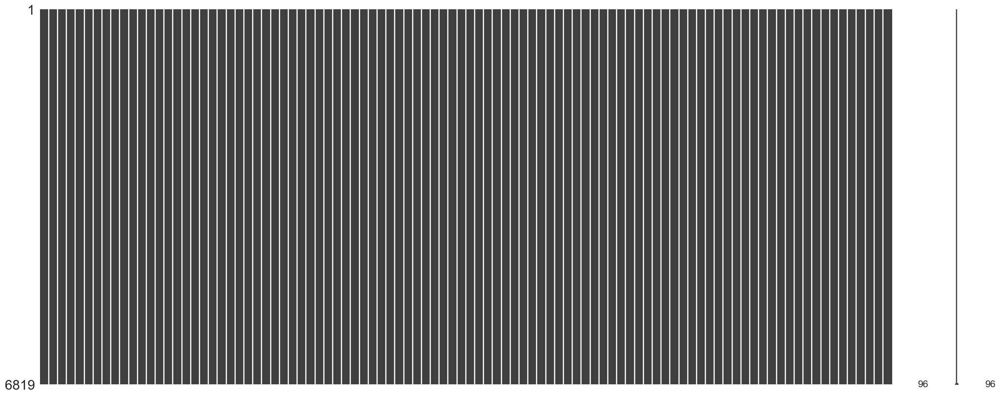

In [6]:
# missing data
msno.matrix(dt)
plt.show()

#### Basic info

In [7]:
dt.info() 
# check: Liability-Assets Flag, Net Income Flag

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Bankrupt?                                                6819 non-null   int64  
 1   ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2   ROA(A) before interest and % after tax                   6819 non-null   float64
 3   ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4   Operating Gross Margin                                   6819 non-null   float64
 5   Realized Sales Gross Margin                              6819 non-null   float64
 6   Operating Profit Rate                                    6819 non-null   float64
 7   Pre-tax net Interest Rate                                6819 non-null   float64
 8   After-tax net Interest Rate 

In [8]:
# change display settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Disable scientific notation
pd.set_option('display.float_format', '{:.3f}'.format)

dt.describe().T

# Net Income Flag <- to be removed

,count,mean,std,min,25%,50%,75%,max
Bankrupt?,6819.000,0.032,0.177,0.000,0.000,0.000,0.000,1.000
ROA(C) before interest and depreciation before interest,6819.000,0.505,0.061,0.000,0.477,0.503,0.536,1.000
ROA(A) before interest and % after tax,6819.000,0.559,0.066,0.000,0.536,0.560,0.589,1.000
ROA(B) before interest and depreciation after tax,6819.000,0.554,0.062,0.000,0.527,0.552,0.584,1.000
Operating Gross Margin,6819.000,0.608,0.017,0.000,0.600,0.606,0.614,1.000
Realized Sales Gross Margin,6819.000,0.608,0.017,0.000,0.600,0.606,0.614,1.000
Operating Profit Rate,6819.000,0.999,0.013,0.000,0.999,0.999,0.999,1.000
Pre-tax net Interest Rate,6819.000,0.797,0.013,0.000,0.797,0.797,0.798,1.000
After-tax net Interest Rate,6819.000,0.809,0.014,0.000,0.809,0.809,0.809,1.000
Non-industry income and expenditure/revenue,6819.000,0.304,0.011,0.000,0.303,0.304,0.304,1.000


In [9]:
# Outliers
Q1 = dt.quantile(0.25)
Q3 = dt.quantile(0.75)
IQR = Q3 - Q1

outliers = ((dt < (Q1 - 1.5 * IQR)) | (dt > (Q3 + 1.5 * IQR)))

# number of outliers
outliers_sum = outliers.sum()
outliers_sum

Bankrupt?                                                   220
ROA(C) before interest and depreciation before interest     391
ROA(A) before interest and % after tax                      561
ROA(B) before interest and depreciation after tax           432
Operating Gross Margin                                      320
Realized Sales Gross Margin                                 318
Operating Profit Rate                                       716
Pre-tax net Interest Rate                                   773
After-tax net Interest Rate                                 867
Non-industry income and expenditure/revenue                1094
Continuous interest rate (after tax)                        806
Operating Expense Rate                                        0
Research and development expense rate                       182
Cash flow rate                                              576
Interest-bearing debt interest rate                         396
Tax rate (A)                            

In [10]:
# Z-scores
z_scores = np.abs(stats.zscore(dt.select_dtypes(include=[np.number])))

# z-score based outliers
outliers_z = (z_scores > 3)

outliers_z.sum()

Bankrupt?                                                  220
ROA(C) before interest and depreciation before interest     88
ROA(A) before interest and % after tax                     110
ROA(B) before interest and depreciation after tax          101
Operating Gross Margin                                      63
Realized Sales Gross Margin                                 63
Operating Profit Rate                                        2
Pre-tax net Interest Rate                                    7
After-tax net Interest Rate                                  7
Non-industry income and expenditure/revenue                  6
Continuous interest rate (after tax)                         7
Operating Expense Rate                                       0
Research and development expense rate                       35
Cash flow rate                                              89
Interest-bearing debt interest rate                        146
Tax rate (A)                                           

In [11]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

"#### A large number of outliers; however, due to the nature of this dataset and the purpose of the analysis – identifying bankrupt companies – I will not remove the outliers."

In [12]:
dt['Bankrupt?'].value_counts()
# only 220

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

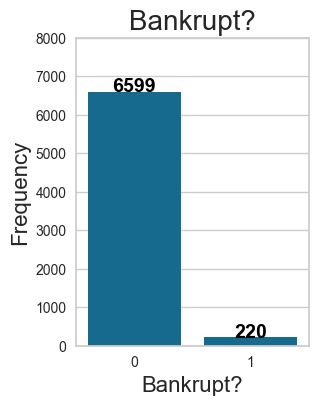

In [13]:
# Target variable
plt.figure(figsize=(3, 4)) 

ax = sns.countplot(x='Bankrupt?', data=dt)  # Rysowanie wykresu countplot

plt.title('Bankrupt?', fontsize=20)   # tytuł
plt.xlabel('Bankrupt?', fontsize=16)  # etykieta osi x
plt.ylabel('Frequency', fontsize=16)  # etykieta osi y
plt.ylim(0, 8000)

# Add frequency
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=14, color='black', fontweight='bold')

plt.show()

In [14]:
# Liability-Assets Flag
dt['Liability-Assets Flag'].value_counts()

Liability-Assets Flag
0    6811
1       8
Name: count, dtype: int64

In [15]:
# Net Income Flag
dt['Net Income Flag'].value_counts()
# remove

Net Income Flag
1    6819
Name: count, dtype: int64

In [16]:
dt.drop(columns=['Net Income Flag'], inplace=True)

#### Dataset

In [17]:
#dt.head()
dt.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
6814,0,0.494,0.539,0.543,0.604,0.604,0.999,0.797,0.809,0.304,...,0,0.800,0.000,0.624,0.604,0.840,0.280,0.027,0.566,0.030
6815,0,0.475,0.538,0.524,0.598,0.598,0.999,0.797,0.809,0.304,...,0,0.800,0.002,0.624,0.598,0.840,0.278,0.027,0.566,0.038
6816,0,0.473,0.534,0.521,0.610,0.610,0.999,0.797,0.809,0.304,...,0,0.798,0.003,0.624,0.610,0.840,0.276,0.027,0.565,0.098
6817,0,0.506,0.560,0.554,0.608,0.608,0.999,0.797,0.809,0.303,...,0,0.812,0.003,0.624,0.608,0.841,0.278,0.027,0.565,0.044
6818,0,0.493,0.570,0.550,0.627,0.627,0.998,0.802,0.814,0.313,...,0,0.816,0.001,0.627,0.627,0.841,0.275,0.027,0.565,0.234


In [18]:
# Test & training split
dt['stratify_var'] = dt['Bankrupt?'].astype(str) + '_' + dt['Liability-Assets Flag'].astype(str)

X = dt.drop(['Bankrupt?', 'stratify_var'], axis=1)
y = dt['Bankrupt?']
stratify_var = dt['stratify_var']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=stratify_var, random_state=666)

In [19]:
X_train['Liability-Assets Flag'].value_counts()

Liability-Assets Flag
0    5448
1       7
Name: count, dtype: int64

In [20]:
X_test['Liability-Assets Flag'].value_counts()

Liability-Assets Flag
0    1363
1       1
Name: count, dtype: int64

In [21]:
y_test

3166    0
4287    0
2143    0
3429    0
4201    0
       ..
3139    0
6119    0
1083    0
3353    0
5871    0
Name: Bankrupt?, Length: 1364, dtype: int64

### c. Visual inspection of distributions

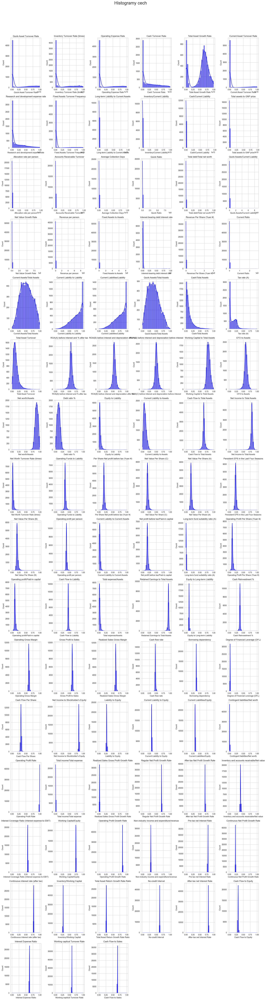

In [22]:
numeric_cols = X_train.select_dtypes(include=[np.number]).drop(columns=['Liability-Assets Flag'])

# variance of each variable
variances = numeric_cols.var()

# sort by variance
sorted_cols = variances.sort_values(ascending=False).index

# number of rows
num_cols = 6
num_rows = len(sorted_cols) // num_cols + (len(sorted_cols) % num_cols > 0)

# figure size
plt.figure(figsize=(20, num_rows * 5))

# plot histograms
for i, column in enumerate(sorted_cols, 1):
    plt.subplot(num_rows, num_cols, i)  # Tworzenie siatki wykresów
    sns.histplot(dt[column], bins=25, kde=True, color='blue')  # Tworzenie histogramu z krzywą KDE
    plt.title(column)  # Tytuł każdego wykresu

#
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle('Histogramy cech', fontsize=24)
plt.show()

#### violin plots

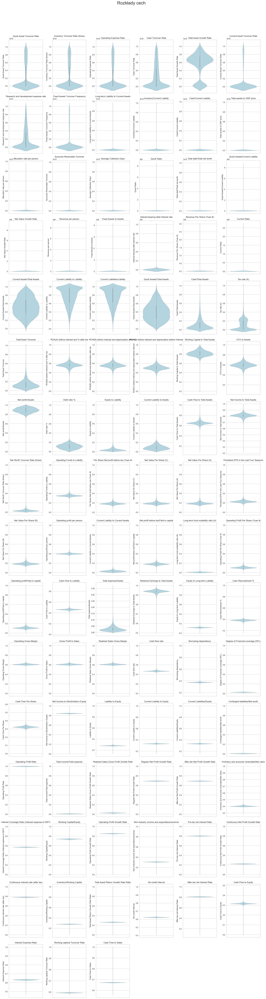

In [23]:
sns.set_style("whitegrid")
plt.figure(figsize=(20, num_rows * 5))

for i, column in enumerate(sorted_cols, 1):
    plt.subplot(num_rows, num_cols, i)  # Tworzenie siatki wykresów
    sns.violinplot(y=X_train[column], color='lightblue')  # Wykres skrzypcowy
    plt.title(column)  # Tytuł każdego wykresu

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle('Rozkłady cech', fontsize=24)
plt.show()

In [24]:
X_train.shape

(5455, 94)

In [25]:
X_train

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
5844,0.516,0.575,0.568,0.610,0.610,0.999,0.798,0.809,0.304,0.782,...,0,0.821,0.003,0.624,0.610,0.842,0.278,0.027,0.566,0.037
1859,0.548,0.586,0.588,0.612,0.612,0.999,0.798,0.809,0.304,0.782,...,0,0.824,0.001,0.616,0.612,0.842,0.279,0.027,0.566,0.032
1794,0.564,0.638,0.624,0.617,0.617,0.999,0.798,0.809,0.304,0.782,...,0,0.840,0.001,0.624,0.617,0.843,0.279,0.027,0.565,0.034
3632,0.473,0.530,0.526,0.603,0.603,0.999,0.797,0.809,0.303,0.782,...,0,0.796,0.001,0.625,0.603,0.840,0.275,0.027,0.565,0.139
3405,0.571,0.657,0.640,0.628,0.628,0.999,0.798,0.810,0.304,0.782,...,0,0.866,0.003,0.624,0.628,0.844,0.276,0.027,0.565,0.114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4879,0.564,0.621,0.620,0.613,0.613,0.999,0.798,0.810,0.304,0.782,...,0,0.833,0.001,0.624,0.613,0.842,0.277,0.027,0.565,0.060
2386,0.466,0.539,0.518,0.610,0.610,0.999,0.797,0.809,0.304,0.782,...,0,0.799,0.001,0.623,0.610,0.840,0.287,0.027,0.566,0.018
3851,0.539,0.602,0.595,0.618,0.618,0.999,0.798,0.809,0.303,0.782,...,0,0.836,0.001,0.624,0.618,0.842,0.277,0.027,0.565,0.059
4595,0.475,0.540,0.530,0.597,0.597,0.999,0.797,0.809,0.304,0.782,...,0,0.799,0.012,0.625,0.597,0.840,0.281,0.028,0.568,0.027


In [26]:
features = [col for col in X_train.select_dtypes(include=[np.number]).columns if col != 'Bankrupt?']

In [27]:
# Yeo-Johnson transformer
pt = PowerTransformer(method='yeo-johnson')

# transform
X_train_transformed = pt.fit_transform(X_train[features])
X_train_transformed = pd.DataFrame(X_train_transformed, columns=features)
X_train_transformed

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.156,0.210,0.201,0.097,0.098,0.095,0.031,0.029,0.020,0.028,...,-0.036,0.280,-0.209,0.003,0.097,0.140,-0.213,-0.060,0.012,0.016
1,0.694,0.385,0.540,0.230,0.231,0.542,0.040,0.034,-0.005,0.030,...,-0.036,0.368,-0.397,-0.871,0.230,0.187,-0.107,-0.065,0.008,-0.276
2,0.971,1.263,1.175,0.520,0.522,0.307,0.024,0.026,-0.007,0.024,...,-0.036,0.907,-0.344,0.009,0.520,0.337,-0.145,-0.103,-0.021,-0.180
3,-0.553,-0.488,-0.488,-0.321,-0.321,-0.063,-0.004,-0.002,-0.011,-0.002,...,-0.036,-0.456,-0.394,0.074,-0.322,-0.092,-0.580,-0.103,-0.021,2.017
4,1.088,1.607,1.462,1.201,1.198,0.806,0.068,0.074,0.008,0.070,...,-0.036,1.881,-0.256,0.034,1.201,0.386,-0.556,-0.103,-0.021,1.862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5450,0.963,0.963,1.091,0.275,0.298,0.199,0.059,0.057,0.048,0.056,...,-0.036,0.683,-0.376,-0.002,0.275,0.198,-0.424,-0.095,-0.014,0.943
5451,-0.671,-0.365,-0.615,0.086,0.087,-0.061,0.002,0.004,-0.003,-0.001,...,-0.036,-0.377,-0.343,-0.076,0.086,-0.045,0.824,0.001,0.049,-1.279
5452,0.548,0.653,0.656,0.584,0.586,0.332,0.021,0.023,-0.012,0.022,...,-0.036,0.778,-0.347,0.018,0.585,0.221,-0.421,-0.103,-0.021,0.925
5453,-0.524,-0.347,-0.429,-0.647,-0.646,-0.078,-0.002,0.001,-0.008,-0.000,...,-0.036,-0.358,0.357,0.142,-0.646,-0.052,0.078,0.494,0.205,-0.631


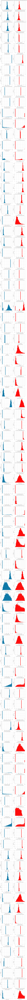

In [28]:
# compare raw and transforemd variables
cols = 2
rows = 94

# fig size
plt.figure(figsize=(10, rows * 4))

for i, col in enumerate(numeric_cols.columns):
    # Oryginalne dane
    plt.subplot(rows, cols, 2*i + 1) 
    X_train[col].hist(bins=30)
    plt.title(f'Raw: {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Yeo-Johnsona
    plt.subplot(rows, cols, 2*i + 2) 
    X_train_transformed[col].hist(bins=30, color='red') 
    plt.title(f'Yeo-Johnson: {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [29]:
# Skewness and kurtosis of variables before and after transformation
# Selecting variables with acceptable skewness and kurtosis or those that have improved by at least 20%

# Calculate skewness and kurtosis before transformation
skew_before = X_train[features].apply(lambda x: skew(x))
kurtosis_before = X_train[features].apply(lambda x: kurtosis(x))

# Yeo-Johnsona
pt = PowerTransformer(method='yeo-johnson')
X_train_transformed = pd.DataFrame(pt.fit_transform(X_train[features]), columns=features)

# Skewness and kurtosis after transformation
skew_after = X_train_transformed.apply(lambda x: skew(x))
kurtosis_after = X_train_transformed.apply(lambda x: kurtosis(x))

# compare results
improvement = pd.DataFrame({
    'Skew Before': skew_before,
    'Skew After': skew_after,
    'Kurtosis Before': kurtosis_before,
    'Kurtosis After': kurtosis_after
})

# Improvment
improvement['Skew Improvement'] = abs(improvement['Skew Before']) - abs(improvement['Skew After'])
improvement['Kurtosis Improvement'] = abs(improvement['Kurtosis Before']) - abs(improvement['Kurtosis After'])

# Criterions
acceptable_skewness = 1
acceptable_kurtosis = 1
threshold = 20

# % of improvment
improvement['Skew Percent Improvement'] = (abs(improvement['Skew Before']) - abs(improvement['Skew After'])) / abs(improvement['Skew Before']) * 100
improvement['Kurtosis Percent Improvement'] = (abs(improvement['Kurtosis Before']) - abs(improvement['Kurtosis After'])) / abs(improvement['Kurtosis Before']) * 100

# Acceptable after transformation?
improvement['Skew Acceptable'] = abs(improvement['Skew After']) < acceptable_skewness
improvement['Kurtosis Acceptable'] = abs(improvement['Kurtosis After']) < acceptable_kurtosis

# Combine criterions
improvement['Improved'] = (
    ((improvement['Skew Percent Improvement'] > threshold) & improvement['Skew Acceptable']) |
    ((improvement['Kurtosis Percent Improvement'] > threshold) & improvement['Kurtosis Acceptable'])
)

variables_to_transform = improvement[improvement['Improved']].index.tolist()
variables_not_to_transform = improvement[~improvement['Improved']].index.tolist()

In [30]:
print(variables_not_to_transform)

['Operating Gross Margin', 'Realized Sales Gross Margin', 'Operating Profit Rate', 'Pre-tax net Interest Rate', 'After-tax net Interest Rate', 'Non-industry income and expenditure/revenue', 'Continuous interest rate (after tax)', 'Interest-bearing debt interest rate', 'Revenue Per Share (Yuan ¥)', 'Realized Sales Gross Profit Growth Rate', 'Operating Profit Growth Rate', 'After-tax Net Profit Growth Rate', 'Regular Net Profit Growth Rate', 'Continuous Net Profit Growth Rate', 'Total Asset Growth Rate', 'Net Value Growth Rate', 'Total Asset Return Growth Rate Ratio', 'Quick Ratio', 'Interest Expense Ratio', 'Total debt/Total net worth', 'Long-term fund suitability ratio (A)', 'Borrowing dependency', 'Contingent liabilities/Net worth', 'Inventory and accounts receivable/Net value', 'Accounts Receivable Turnover', 'Average Collection Days', 'Operating profit per person', 'Allocation rate per person', 'Quick Assets/Current Liability', 'Cash/Current Liability', 'Inventory/Working Capital', 

In [31]:
print(variables_to_transform)

['ROA(C) before interest and depreciation before interest', 'ROA(A) before interest and % after tax', 'ROA(B) before interest and depreciation after tax', 'Operating Expense Rate', 'Research and development expense rate', 'Cash flow rate', 'Tax rate (A)', 'Net Value Per Share (B)', 'Net Value Per Share (A)', 'Net Value Per Share (C)', 'Persistent EPS in the Last Four Seasons', 'Cash Flow Per Share', 'Operating Profit Per Share (Yuan ¥)', 'Per Share Net profit before tax (Yuan ¥)', 'Cash Reinvestment %', 'Current Ratio', 'Debt ratio %', 'Net worth/Assets', 'Operating profit/Paid-in capital', 'Net profit before tax/Paid-in capital', 'Total Asset Turnover', 'Inventory Turnover Rate (times)', 'Fixed Assets Turnover Frequency', 'Net Worth Turnover Rate (times)', 'Revenue per person', 'Working Capital to Total Assets', 'Quick Assets/Total Assets', 'Current Assets/Total Assets', 'Cash/Total Assets', 'Current Liability to Assets', 'Operating Funds to Liability', 'Current Liabilities/Liability'

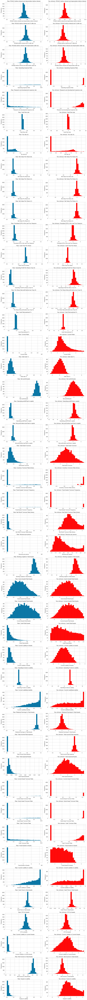

In [32]:
# List of variables to be transfored
variables = variables_to_transform
num_vars = len(variables)

# 2 cols
cols = 2

# number of rows
rows = num_vars

# fig size
plt.figure(figsize=(12, rows * 3))


for i, col in enumerate(variables):
    # Oryginalne dane
    plt.subplot(rows, cols, 2 * i + 1)
    X_train[col].hist(bins=30)
    plt.title(f'Raw: {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Yeo-Johnson
    plt.subplot(rows, cols, 2 * i + 2)
    X_train_transformed[col].hist(bins=30, color='red')
    plt.title(f'Yeo-Johnson: {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

# Hist
plt.tight_layout()
plt.show()

### d. Correlation analysis

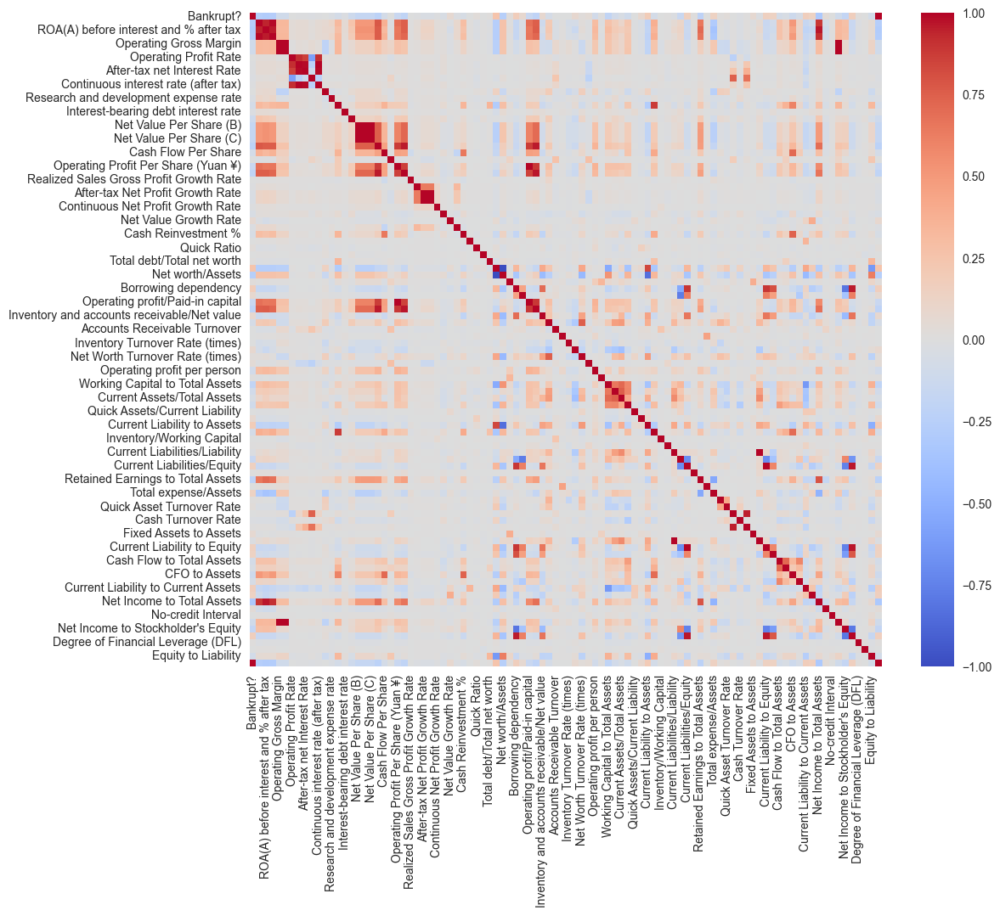

In [33]:
plt.figure(figsize=(12,10))
sns.heatmap(dt.corr(), cmap='coolwarm')
plt.show()

In [34]:
variables_to_transform

['ROA(C) before interest and depreciation before interest',
 'ROA(A) before interest and % after tax',
 'ROA(B) before interest and depreciation after tax',
 'Operating Expense Rate',
 'Research and development expense rate',
 'Cash flow rate',
 'Tax rate (A)',
 'Net Value Per Share (B)',
 'Net Value Per Share (A)',
 'Net Value Per Share (C)',
 'Persistent EPS in the Last Four Seasons',
 'Cash Flow Per Share',
 'Operating Profit Per Share (Yuan ¥)',
 'Per Share Net profit before tax (Yuan ¥)',
 'Cash Reinvestment %',
 'Current Ratio',
 'Debt ratio %',
 'Net worth/Assets',
 'Operating profit/Paid-in capital',
 'Net profit before tax/Paid-in capital',
 'Total Asset Turnover',
 'Inventory Turnover Rate (times)',
 'Fixed Assets Turnover Frequency',
 'Net Worth Turnover Rate (times)',
 'Revenue per person',
 'Working Capital to Total Assets',
 'Quick Assets/Total Assets',
 'Current Assets/Total Assets',
 'Cash/Total Assets',
 'Current Liability to Assets',
 'Operating Funds to Liability',
 

# 2. ML

#### Scale and transform

In [35]:
# Yeo-Johnson
yeojohnson_transformer = ColumnTransformer(
    transformers=[
        ('yeojohnson', PowerTransformer(method='yeo-johnson'), variables_to_transform)
    ],
    remainder='passthrough',
    verbose_feature_names_out=False  # Ustawienie na False, aby zachować oryginalne nazwy kolumn
)

# Pipeline:Yeo-Johnsona & standardise
full_pipeline = Pipeline(steps=[
    ('yeojohnson', yeojohnson_transformer),
    ('scaler', StandardScaler())
])

# trainig
X_train_transformed = full_pipeline.fit_transform(X_train)

# test
X_test_transformed = full_pipeline.transform(X_test)


feature_names = X_train.columns

# data frames
X_train_transformed = pd.DataFrame(X_train_transformed, columns=feature_names, index=X_train.index)
X_test_transformed = pd.DataFrame(X_test_transformed, columns=feature_names, index=X_test.index)

In [36]:
X_train_vif = X_train.copy()
y_train_vif = y_train.copy()


X_train_vif = sm.add_constant(X_train_vif)

def calculate_vif(X_train_vif, thresh=10.0):
    variables = list(X_train_vif.columns)
    variables.remove('const') 
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(X_train_vif[variables].values, i)
               for i in range(len(variables))]

        max_vif = max(vif)
        if max_vif > thresh:
            maxloc = vif.index(max_vif)
            print(f"Usuwamy '{variables[maxloc]}' o VIF: {max_vif}")
            del variables[maxloc]
            dropped = True

    print("Pozostałe zmienne:")
    print(variables)
    return X_train_vif[['const'] + variables]  # Dodajemy 'const' z powrotem


X_reduced = calculate_vif(X_train_vif)

Usuwamy 'Net worth/Assets' o VIF: 163725583574.01736
Usuwamy 'Current Liabilities/Liability' o VIF: 3676407859077.956
Usuwamy 'Operating Profit Rate' o VIF: 607527266608.7274
Usuwamy 'Operating Gross Margin' o VIF: 75031231817.31163
Usuwamy 'Current Liability to Equity' o VIF: 3171435129.7034373
Usuwamy 'Current Assets/Total Assets' o VIF: 36414.234628730184
Usuwamy 'Net Income to Stockholder's Equity' o VIF: 28591.68138057351
Usuwamy 'After-tax net Interest Rate' o VIF: 29672516.078563705
Usuwamy 'Liability to Equity' o VIF: 141698.6472101286
Usuwamy 'Net Value Per Share (A)' o VIF: 129947.82572827081
Usuwamy 'Cash Flow to Equity' o VIF: 6293.103657269177
Usuwamy 'Cash flow rate' o VIF: 5446.5912990384095
Usuwamy 'Interest Coverage Ratio (Interest expense to EBIT)' o VIF: 1960.1273432765047
Usuwamy 'Realized Sales Gross Margin' o VIF: 1283707.8531339066
Usuwamy 'Working Capital/Equity' o VIF: 157046.2079089177
Usuwamy 'Operating Profit Growth Rate' o VIF: 12907.67954757204
Usuwamy 'Gr

In [37]:
X_reduced.drop(columns=['const'],inplace=True)
selected_v = X_reduced.columns.tolist()

### 3 experiments

In [38]:
#EXP1 raw data
train_data = X_train.copy()
train_data['Bankrupt?'] = y_train

test_data = X_test.copy()
test_data['Bankrupt?'] = y_test

In [39]:
#EXP 2 trasformed
train_T_data = X_train_transformed.copy()
train_T_data['Bankrupt?'] = y_train

test_T_data = X_test_transformed.copy()
test_T_data['Bankrupt?'] = y_test

In [40]:
#EXP 3 chosen variables
train_V_data = X_train.copy()
train_V_data = train_V_data[selected_v]
train_V_data['Bankrupt?'] = y_train

test_V_data = X_test.copy()
test_V_data = test_V_data[selected_v]
test_V_data['Bankrupt?'] = y_test

### b. Models

In [41]:
models_to_compare = [
   'catboost',  # CatBoost Classifier (lub 'cat')
   'lr',       #Logistic Regression
#    'knn',     #K Neighbors Classifier
    'nb',      #Naive Bayes
    'dt',      #Decision Tree Classifier
    'svm',     #SVM - Linear Kernel
#    'rbfsvm',  #SVM - Radial Kernel
#    'gpc',     #Gaussian Process Classifier
#    'mlp',     #MLP Classifier
    'ridge',   #Ridge Classifier
    'rf',      #Random Forest Classifier
    'qda',     #Quadratic Discriminant Analysis
    'ada',     #Ada Boost Classifier
    'gbc',     #Gradient Boosting Classifier
    'lda',     #Linear Discriminant Analysis
    'et',      #Extra Trees Classifier
    'xgboost', #Extreme Gradient Boosting
    'lightgbm',#Light Gradient Boosting Machine
#    'dummy'    #Dummy Classifier
]


In [42]:
# F2 optimize
def f2_score(y_true, y_pred, **kwargs):
    return fbeta_score(y_true, y_pred, beta=2, **kwargs)
    
# Ex 1
exp_clf1 = ClassificationExperiment()
exp_clf1.setup(
    data=train_data,
    target='Bankrupt?',
    test_data=test_data,
    session_id=666,
    use_gpu=True,
    fix_imbalance=True,
    fix_imbalance_method='adasyn',
    normalize=False,
    data_split_shuffle=False,
    fold=8,
    html=True
)

exp_clf1.add_metric(
    id='F2',
    name='F2 Score',
    score_func=f2_score,
    greater_is_better=True,
    optimize_for='binary',
    display_name='F2 Score'
)

best_model1 = exp_clf1.compare_models(include=models_to_compare, sort='F2 Score')

# Ex 2
exp_clf2 = ClassificationExperiment()
exp_clf2.setup(
    data=train_T_data,
    target='Bankrupt?',
    test_data=test_T_data,
    session_id=666,
    use_gpu=True,
    fix_imbalance=True,
    fix_imbalance_method='adasyn',
    normalize=False,
    data_split_shuffle=False,
    fold=8,
    html=True
)

exp_clf2.add_metric(
    id='F2',
    name='F2 Score',
    score_func=f2_score,
    greater_is_better=True,
    optimize_for='binary',
    display_name='F2 Score'
)

best_model2 = exp_clf2.compare_models(include=models_to_compare, sort='F2 Score')


# Ex 3
exp_clf3 = ClassificationExperiment()
exp_clf3.setup(
    data=train_V_data,
    target='Bankrupt?',
    test_data=test_V_data,
    session_id=666,
    use_gpu=True,
    fix_imbalance=True,
    fix_imbalance_method='adasyn',
    normalize=False,
    data_split_shuffle=False,
    fold=8,
    html=True
)

exp_clf3.add_metric(
    id='F2',
    name='F2 Score',
    score_func=f2_score,
    greater_is_better=True,
    optimize_for='binary',
    display_name='F2 Score'
)

best_model3 = exp_clf3.compare_models(include=models_to_compare, sort='F2 Score')

# Results
results1 = exp_clf1.pull()
results2 = exp_clf2.pull()
results3 = exp_clf3.pull()

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1


[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1


[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


,Description,Value
0,Session id,666
1,Target,Bankrupt?
2,Target type,Binary
3,Original data shape,"(6819, 95)"
4,Transformed data shape,"(11906, 95)"
5,Transformed train set shape,"(10542, 95)"
6,Transformed test set shape,"(1364, 95)"
7,Numeric features,94
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,F2 Score,TT (Sec)
et,Extra Trees Classifier,0.9593,0.9394,0.5852,0.4121,0.4822,0.4618,0.4702,0.5386,0.9112
gbc,Gradient Boosting Classifier,0.9406,0.9369,0.6307,0.3009,0.4063,0.3792,0.4088,0.5158,47.5550
lda,Linear Discriminant Analysis,0.9157,0.9047,0.7102,0.2341,0.3516,0.3186,0.3760,0.5039,0.2762
lightgbm,Light Gradient Boosting Machine,0.9622,0.9370,0.5057,0.4376,0.4656,0.4464,0.4494,0.4878,1.1875
rf,Random Forest Classifier,0.9556,0.9336,0.5114,0.3719,0.4290,0.4067,0.4131,0.4743,6.6612
ridge,Ridge Classifier,0.8744,0.9143,0.8011,0.1802,0.2939,0.2546,0.3419,0.4733,0.2588
ada,Ada Boost Classifier,0.9258,0.9051,0.6080,0.2424,0.3463,0.3147,0.3526,0.4666,8.3900
xgboost,Extreme Gradient Boosting,0.9632,0.9344,0.4489,0.4419,0.4428,0.4239,0.4252,0.4458,1.7050
dt,Decision Tree Classifier,0.9316,0.6928,0.4375,0.2208,0.2927,0.2611,0.2783,0.3649,3.3088
qda,Quadratic Discriminant Analysis,0.5039,0.6893,0.7443,0.0468,0.0881,0.0292,0.0851,0.1870,0.3388


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


,Description,Value
0,Session id,666
1,Target,Bankrupt?
2,Target type,Binary
3,Original data shape,"(6819, 95)"
4,Transformed data shape,"(11906, 95)"
5,Transformed train set shape,"(10542, 95)"
6,Transformed test set shape,"(1364, 95)"
7,Numeric features,94
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,F2 Score,TT (Sec)
lr,Logistic Regression,0.8838,0.9032,0.7784,0.1873,0.3017,0.2634,0.3451,0.4767,0.4762
gbc,Gradient Boosting Classifier,0.9375,0.9215,0.5625,0.2760,0.3695,0.3409,0.3653,0.4648,32.8138
lda,Linear Discriminant Analysis,0.8667,0.8970,0.8125,0.1719,0.2835,0.2432,0.3348,0.4647,0.2675
ridge,Ridge Classifier,0.8656,0.8978,0.8125,0.1707,0.2818,0.2413,0.3332,0.4628,0.1950
ada,Ada Boost Classifier,0.9223,0.8952,0.6080,0.2318,0.3354,0.3029,0.3432,0.4587,6.2362
svm,SVM - Linear Kernel,0.8764,0.8849,0.7557,0.1755,0.2838,0.2443,0.3247,0.4521,0.3475
rf,Random Forest Classifier,0.9582,0.9337,0.4716,0.3898,0.4245,0.4033,0.4063,0.4508,5.2662
et,Extra Trees Classifier,0.9619,0.9349,0.4545,0.4241,0.4377,0.4180,0.4189,0.4473,0.8412
lightgbm,Light Gradient Boosting Machine,0.9597,0.9272,0.4091,0.3952,0.3989,0.3782,0.3798,0.4041,1.1900
xgboost,Extreme Gradient Boosting,0.9600,0.9271,0.4034,0.4140,0.4008,0.3805,0.3845,0.4007,1.5462


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


,Description,Value
0,Session id,666
1,Target,Bankrupt?
2,Target type,Binary
3,Original data shape,"(6819, 42)"
4,Transformed data shape,"(11906, 42)"
5,Transformed train set shape,"(10542, 42)"
6,Transformed test set shape,"(1364, 42)"
7,Numeric features,41
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the prov

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1
[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[LightGBM] [Fatal] CUDA Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_CUDA=1


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,F2 Score,TT (Sec)
gbc,Gradient Boosting Classifier,0.9391,0.9360,0.6420,0.3003,0.4073,0.3800,0.4116,0.5205,72.8488
ada,Ada Boost Classifier,0.9258,0.9123,0.6250,0.2461,0.3529,0.3215,0.3613,0.4775,3.0938
lightgbm,Light Gradient Boosting Machine,0.9599,0.9346,0.4773,0.4059,0.4339,0.4134,0.4174,0.4577,0.9050
rf,Random Forest Classifier,0.9567,0.9338,0.4659,0.3719,0.4113,0.3893,0.3931,0.4416,3.4562
xgboost,Extreme Gradient Boosting,0.9600,0.9352,0.4375,0.4113,0.4175,0.3972,0.4007,0.4276,1.2150
et,Extra Trees Classifier,0.9621,0.9378,0.4205,0.4248,0.4201,0.4006,0.4019,0.4196,1.0412
lda,Linear Discriminant Analysis,0.8361,0.8680,0.7727,0.1391,0.2354,0.1911,0.2817,0.4030,0.1788
ridge,Ridge Classifier,0.8335,0.8713,0.7727,0.1368,0.2321,0.1876,0.2786,0.3993,0.1250
dt,Decision Tree Classifier,0.9226,0.6827,0.4261,0.1907,0.2629,0.2284,0.2494,0.3409,1.0662
lr,Logistic Regression,0.7294,0.6431,0.4489,0.0544,0.0970,0.0419,0.0752,0.1830,0.5362


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,F2 Score
0,Extra Trees Classifier,0.9560,0.9351,0.5227,0.3710,0.4340,0.4118,0.4183,0



Eksperyment 1 - F2 Score na zbiorze testowym: 0.4831932773109244


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,F2 Score
0,Logistic Regression,0.8695,0.8053,0.6364,0.1474,0.2393,0.1973,0.2621,0


Eksperyment 2 - F2 Score na zbiorze testowym: 0.3825136612021858


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,F2 Score
0,Gradient Boosting Classifier,0.9384,0.9405,0.6818,0.3000,0.4167,0.3893,0.4262,0


Eksperyment 3 - F2 Score na zbiorze testowym: 0.5434782608695652


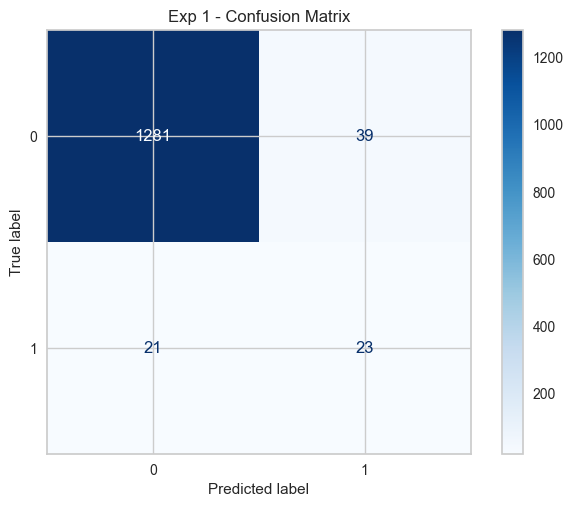

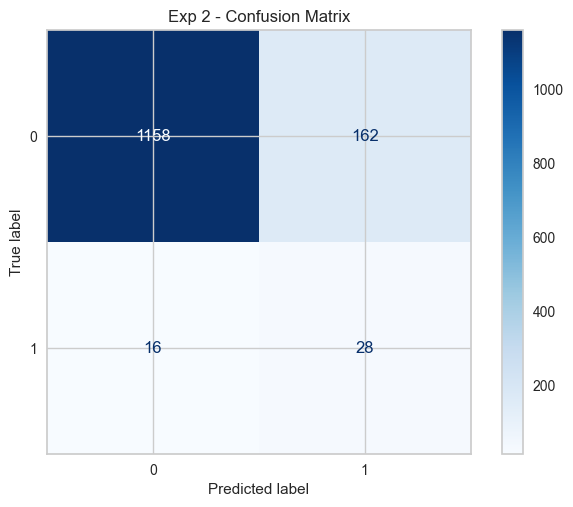

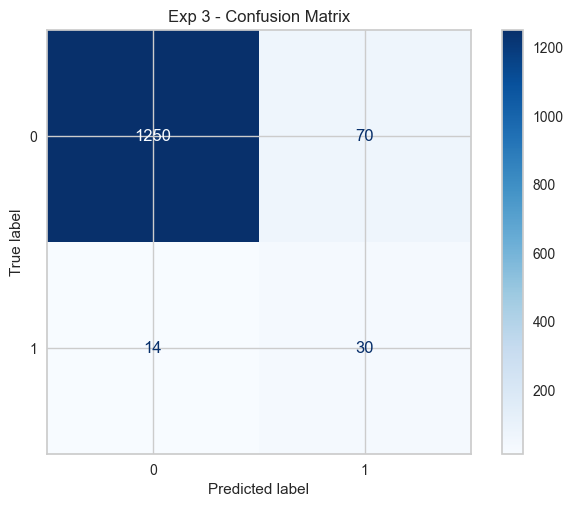

In [43]:
# Predykcje i ewaluacja na zbiorze testowym dla eksperymentu 1
predictions1 = exp_clf1.predict_model(best_model1)
y_true1 = test_data['Bankrupt?']
y_pred1 = predictions1['prediction_label']
f2_test1 = fbeta_score(y_true1, y_pred1, beta=2)
print("\nEksperyment 1 - F2 Score na zbiorze testowym:", f2_test1)

# Predykcje i ewaluacja na zbiorze testowym dla eksperymentu 2
predictions2 = exp_clf2.predict_model(best_model2)
y_true2 = test_T_data['Bankrupt?']
y_pred2 = predictions2['prediction_label']
f2_test2 = fbeta_score(y_true2, y_pred2, beta=2)
print("Eksperyment 2 - F2 Score na zbiorze testowym:", f2_test2)

# Predykcje i ewaluacja na zbiorze testowym dla eksperymentu 3
predictions3 = exp_clf3.predict_model(best_model3)
y_true3 = test_T_data['Bankrupt?']
y_pred3 = predictions3['prediction_label']
f2_test3 = fbeta_score(y_true3, y_pred3, beta=2)
print("Eksperyment 3 - F2 Score na zbiorze testowym:", f2_test3)

# Macierz konfuzji dla eksperymentu 1
cm1 = confusion_matrix(y_true1, y_pred1)
disp1 = ConfusionMatrixDisplay(confusion_matrix=cm1)
disp1.plot(cmap='Blues')
plt.title('Exp 1 - Confusion Matrix')
plt.show()

# Macierz konfuzji dla eksperymentu 2
cm2 = confusion_matrix(y_true2, y_pred2)
disp2 = ConfusionMatrixDisplay(confusion_matrix=cm2)
disp2.plot(cmap='Blues')
plt.title('Exp 2 - Confusion Matrix')
plt.show()

# Macierz konfuzji dla eksperymentu 2
cm3 = confusion_matrix(y_true3, y_pred3)
disp3 = ConfusionMatrixDisplay(confusion_matrix=cm3)
disp3.plot(cmap='Blues')
plt.title('Exp 3 - Confusion Matrix')
plt.show()

In [ ]:
# Tuning hiperparametrów najlepszego modelu z eksperymentu 1
tuned_model1 = exp_clf1.tune_model(
    best_model1,
    optimize='F2 Score',  # Optymalizujemy pod kątem miary F2
    n_iter=100,           
    choose_better=True,   # Wybierz lepszy model między oryginalnym a stuningowanym
    verbose=True
)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,21:24:37
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Extra Trees Classifier


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 8 folds for each of 100 candidates, totalling 800 fits


In [ ]:
# Tuning hiperparametrów najlepszego modelu z eksperymentu 2
tuned_model2 = exp_clf2.tune_model(
    best_model2,
    optimize='F2 Score',
    n_iter=100,
    choose_better=True,
    verbose=True
)

In [ ]:
# Tuning hiperparametrów najlepszego modelu z eksperymentu 2
tuned_model3 = exp_clf3.tune_model(
    best_model3,
    optimize='F2 Score',
    n_iter=100,
    choose_better=True,
    verbose=True
)

In [ ]:
# Dokonanie predykcji na zbiorze testowym
predictions_tuned1 = exp_clf1.predict_model(tuned_model1)

# Obliczenie miary F2 na zbiorze testowym
from sklearn.metrics import fbeta_score

y_true1 = test_data['Bankrupt?']
y_pred1_tuned = predictions_tuned1['prediction_label']

f2_test1_tuned = fbeta_score(y_true1, y_pred1_tuned, beta=2)
print("\nEksperyment 1 - F2 Score na zbiorze testowym po tuningu:", f2_test1_tuned)

In [ ]:
# Dokonanie predykcji na zbiorze testowym
predictions_tuned2 = exp_clf2.predict_model(tuned_model2)

# Obliczenie miary F2 na zbiorze testowym
y_true2 = test_T_data['Bankrupt?']
y_pred2_tuned = predictions_tuned2['prediction_label']

f2_test2_tuned = fbeta_score(y_true2, y_pred2_tuned, beta=2)
print("Eksperyment 2 - F2 Score na zbiorze testowym po tuningu:", f2_test2_tuned)

In [ ]:
# Dokonanie predykcji na zbiorze testowym
predictions_tuned3 = exp_clf3.predict_model(tuned_model3)

# Obliczenie miary F2 na zbiorze testowym
y_true3 = test_T_data['Bankrupt?']
y_pred3_tuned = predictions_tuned3['prediction_label']

f2_test3_tuned = fbeta_score(y_true3, y_pred3_tuned, beta=2)
print("Eksperyment 3 - F2 Score na zbiorze testowym po tuningu:", f2_test3_tuned)

In [ ]:
print("\nEksperyment 1:")
print("F2 Score przed tuningiem:", f2_test1)
print("F2 Score po tuningu:", f2_test1_tuned)

In [ ]:
print("\nEksperyment 2:")
print("F2 Score przed tuningiem:", f2_test2)
print("F2 Score po tuningu:", f2_test2_tuned)

In [ ]:
print("\nEksperyment 3:")
print("F2 Score przed tuningiem:", f2_test3)
print("F2 Score po tuningu:", f2_test3_tuned)

In [ ]:
# Wykres AUC
exp_clf1.plot_model(tuned_model1, plot='auc')

# Wykres ważności cech
exp_clf1.plot_model(tuned_model1, plot='feature')

In [ ]:
# Wykres AUC
exp_clf2.plot_model(tuned_model2, plot='auc')

# Wykres ważności cech
exp_clf2.plot_model(tuned_model2, plot='feature')

In [ ]:
# Wykres AUC
exp_clf3.plot_model(tuned_model3, plot='auc')

In [ ]:
# Wykres ważności cech
exp_clf3.plot_model(tuned_model3, plot='feature')

### b. Analiza SHAP

In [ ]:
#import shap
#import matplotlib.pyplot as plt

# Stworzenie TreeExplainer dla modelu GradientBoostingClassifier
explainer = shap.TreeExplainer(best_model3)  # zakładam, że 'tuned_model3' to Twój wytrenowany model

# Obliczenie wartości SHAP dla przetworzonych danych testowych
shap_values = explainer.shap_values(test_V_data)

# Wygenerowanie wykresu beeswarm
# Przekazanie pełnej macierzy shap_values dla klasyfikacji binarnej (dla obu klas)
shap.summary_plot(shap_values, test_V_data)

In [ ]:
pip freeze > requirements.txt